In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import time
import math
from itertools import product
from cv2 import COLOR_BGR2GRAY, cvtColor, imread, imshow, waitKey, adaptiveThreshold
from PIL import Image
from numpy import dot, exp, mgrid, pi, ravel, square, uint8, zeros
import cmath

In [2]:
def colored_to_gray(img):
    R, G, B = img[:,:,0], img[:,:,1], img[:,:,2]
    gray_img = 0.2989 * R + 0.5870 * G + 0.1140 * B
    return gray_img

In [3]:
def simple_mean_filter(img,k):
    start = time.time()
    h, w = img.shape
    p = (k-1)//2
    new_img = np.zeros((h, w), img.dtype)
    for x in range(w):
        for y in range(h):
            sum = 0
            for i in range(-p,p+1):
                for j in range(-p,p+1):
                    if x+i>=0 and x+i<w and y+j>=0 and y+j<h:
                        sum+=img[x+i,y+j]
            new_img[x,y]=(sum//(k*k))
            
    end = time.time()
    return end-start,new_img

In [3]:
img = cv2.imread('../images/ceramic.jpg')
img = colored_to_gray(img)

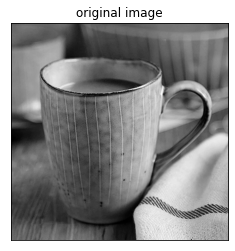

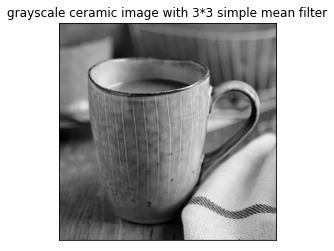

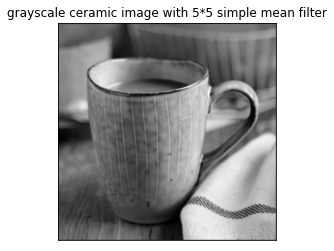

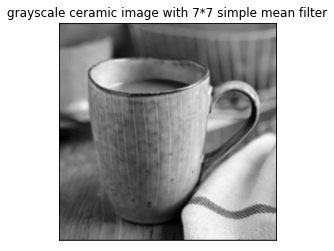

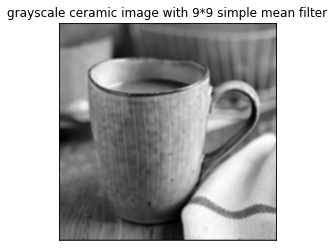

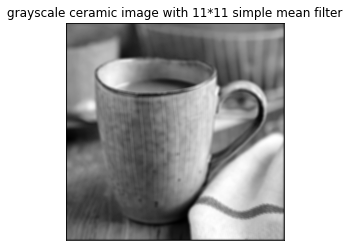

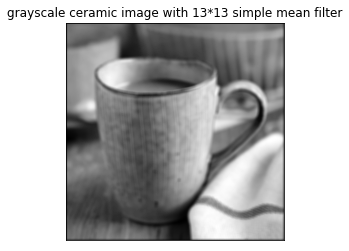

In [4]:
#1.1
plt.imshow(img, cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

for k in range(3,14,2):
    t, op_img = simple_mean_filter(img,k)
    plt.imshow(op_img,cmap='gray')
    plt.title('grayscale ceramic image with {}*{} simple mean filter'.format(k,k))
    plt.xticks([]), plt.yticks([]) 
    plt.show()

In [ ]:
# instead of calculating sum over and over again we will use a cumulative sum array which will give sum for window of size k
def optimised_mean_filter(img,k,dp):
    start = time.time()
    h, w = img.shape
    new_img = np.zeros((h, w), img.dtype)
    p = (k-1)//2
    for x in range(1,w+1):
        for y in range(1,h+1):
            new_img[x-1,y-1] = (dp[min(w,x+p)][min(h,y+p)] - dp[max(0,x-p-1)][min(h,y+p)] - dp[min(w,x+p)][max(0,y-p-1)] + dp[max(0,x-p-1)][max(0,y-p-1)])//(k*k)
      
    end = time.time()
    return end-start,new_img

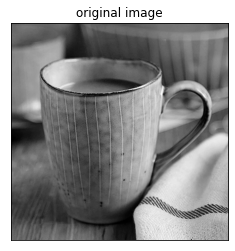

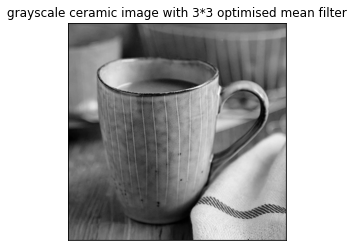

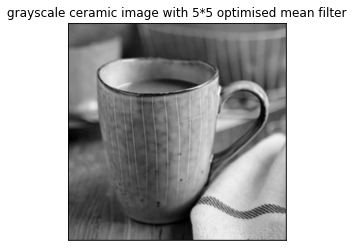

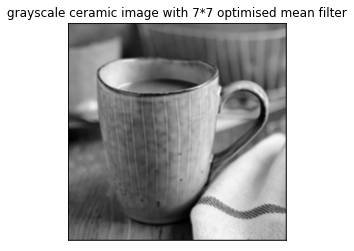

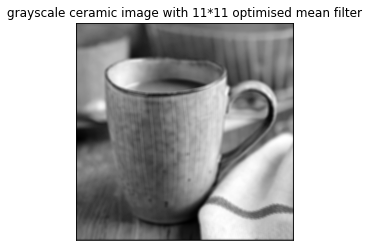

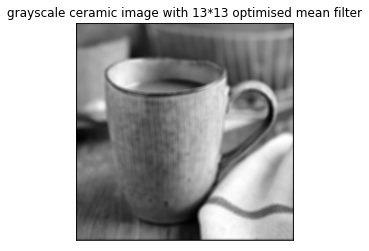

In [6]:
# 1.2
plt.imshow(img, cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()
    
# calculating the cumulative array, to be used for optimised computation
h, w = img.shape
dp = np.zeros((h+1, w+1), img.dtype)

for x in range(1,w+1):
    for y in range(1,h+1):
        dp[x][y] = img[x-1,y-1] + dp[x-1][y] + dp[x][y-1] - dp[x-1][y-1]
    
        

for k in range(3,14,2):
    t, op_img = optimised_mean_filter(img,k,dp)
    plt.imshow(op_img,cmap='gray')
    plt.title('grayscale ceramic image with {}*{} optimised mean filter'.format(k,k))
    plt.xticks([]), plt.yticks([]) 
    plt.show()

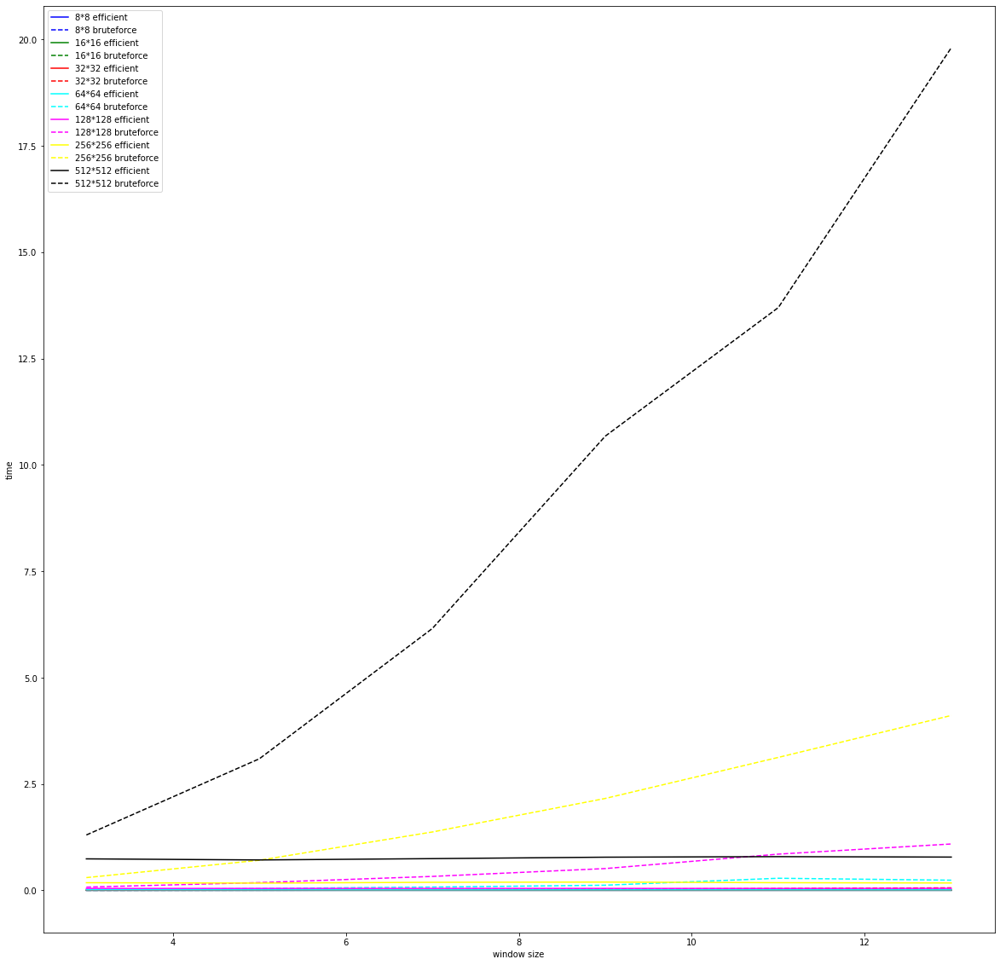

In [7]:
# 1.3
fig = plt.figure()
fig.set_figheight(20)
fig.set_figwidth(20)
legend_name = []
x = [3, 5, 7, 9, 11, 13]
dim = 8
while dim<=512:
    new_img = cv2.resize(img, (dim,dim))
    
    dim_efficient = []
    dim_bruteforce = []
    for k in range(3,14,2):
        t, op_img = optimised_mean_filter(new_img,k,dp)
        dim_efficient.append(t)
        
        t, op_img = simple_mean_filter(new_img,k)
        dim_bruteforce.append(t)
        
    if dim == 8:
        legend_name.append("8*8 efficient")
        plt.plot(x,dim_efficient, color = 'blue')
        legend_name.append("8*8 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'blue', linestyle='dashed')
    elif dim == 16:
        legend_name.append("16*16 efficient")
        plt.plot(x,dim_efficient, color = 'green')
        legend_name.append("16*16 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'green', linestyle='dashed') 
    elif dim == 32:
        legend_name.append("32*32 efficient")
        plt.plot(x,dim_efficient, color = 'red')
        legend_name.append("32*32 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'red', linestyle='dashed')
    elif dim == 64:
        legend_name.append("64*64 efficient")
        plt.plot(x,dim_efficient, color = 'cyan')
        legend_name.append("64*64 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'cyan', linestyle='dashed')
    elif dim == 128:
        legend_name.append("128*128 efficient")
        plt.plot(x,dim_efficient, color = 'magenta')
        legend_name.append("128*128 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'magenta', linestyle='dashed')
    elif dim == 256:
        legend_name.append("256*256 efficient")
        plt.plot(x,dim_efficient, color = 'yellow')
        legend_name.append("256*256 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'yellow', linestyle='dashed')
    elif dim == 512:
        legend_name.append("512*512 efficient")
        plt.plot(x,dim_efficient, color = 'black')
        legend_name.append("512*512 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'black', linestyle='dashed')
        
    dim*=2

plt.legend(legend_name)
plt.xlabel('window size')
plt.ylabel('time')
plt.show()

In [4]:
# 1.4
def simple_median_filter(im, k):
    start = time.time()
    h, w = img.shape
    p = (k-1)//2
    new_img = np.zeros((h, w), img.dtype)
    for x in range(w):
        for y in range(h):
            vec = []
            for i in range(-p,p+1):
                for j in range(-p,p+1):
                    if x+i>=0 and x+i<w and y+j>=0 and y+j<h:
                        vec.append(img[x+i,y+j])
            new_img[x,y]=np.median(vec)
            
    end = time.time()
    return end-start,new_img

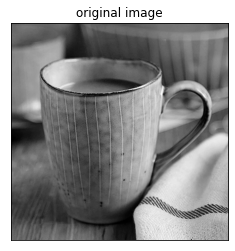

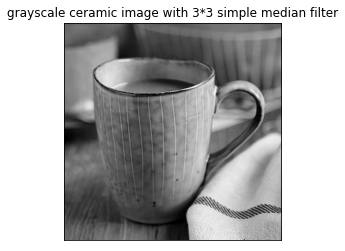

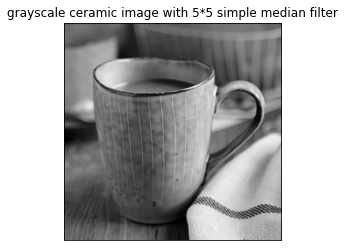

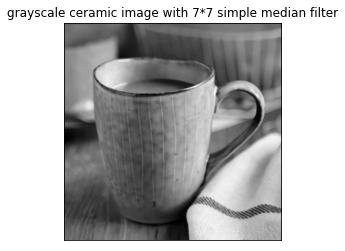

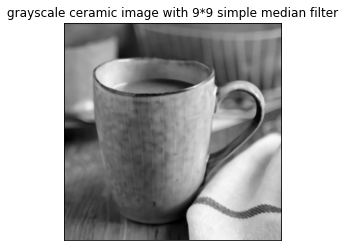

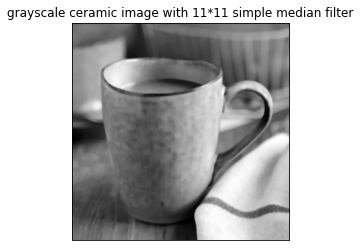

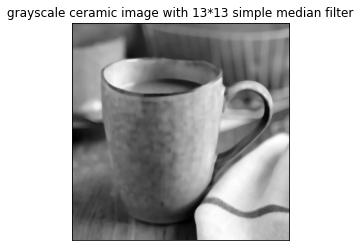

In [83]:
plt.imshow(img, cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

for k in range(3,14,2):
    t, op_img = simple_median_filter(img,k)
    plt.imshow(op_img,cmap='gray')
    plt.title('grayscale ceramic image with {}*{} simple median filter'.format(k,k))
    plt.xticks([]), plt.yticks([]) 
    plt.show()

In [5]:
def optimised_median_filter(img,k):
    start = time.time()
    h, w = img.shape
    p = (k-1)//2
    new_img = np.zeros((h, w), img.dtype)
    
    for i in range(h):
        vec = []
        j = 0
        for k1 in range(-p,p+1):
            for k2 in range(-p,p+1):
                if i+k1>=0 and i+k1<h and j+k2>=0 and j+k2<w:
                    vec.append(img[i+k1,j+k2])
                    
        new_img[i,j] = np.median(vec)
        
        for j in range(1,w):
            # erasing column j-p-1
            if j-p-1>=0:
                for k1 in range(-p,p+1):
                    if i+k1>=0 and i+k1<h:
                        vec.remove(img[i+k1,j-p-1])
                
            # adding column j+p
            if j+p<w:
                for k1 in range(-p,p+1):
                    if i+k1>=0 and i+k1<h:
                        vec.append(img[i+k1,j+p])
                
            new_img[i,j] = np.median(vec)
            
    end = time.time()
    return end-start,new_img

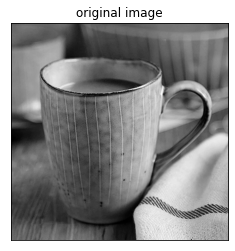

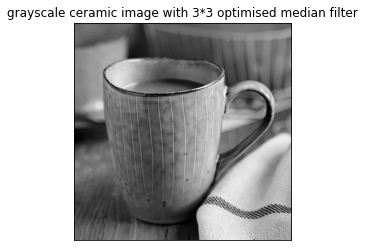

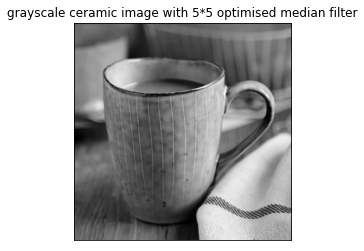

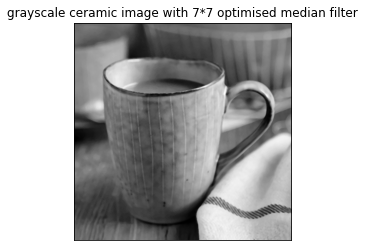

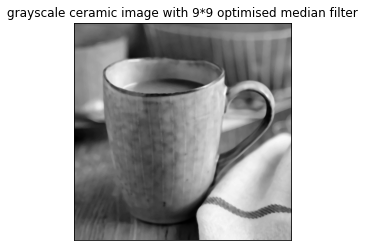

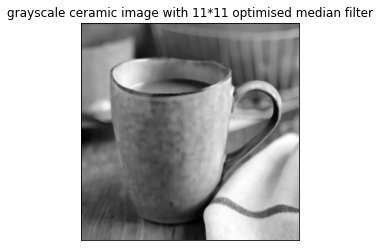

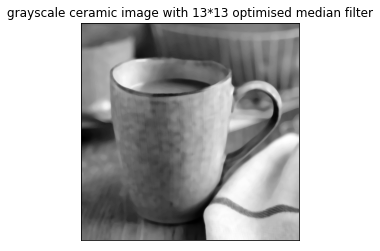

In [ ]:
plt.imshow(img, cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

for k in range(3,14,2):
    t, op_img = optimised_median_filter(img,k)
    plt.imshow(op_img,cmap='gray')
    plt.title('grayscale ceramic image with {}*{} optimised median filter'.format(k,k))
    plt.xticks([]), plt.yticks([]) 
    plt.show()

yes
16
32
64
128
256
512
1024


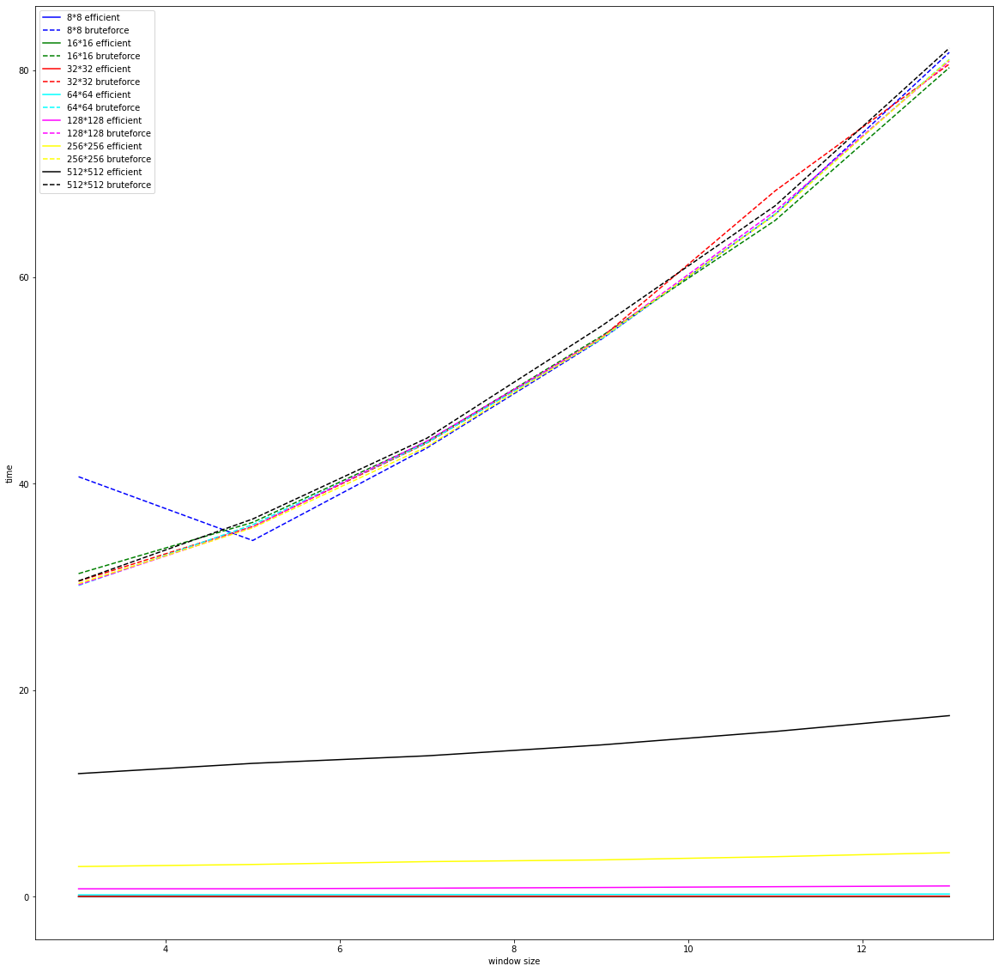

In [6]:
# graph plotting
fig = plt.figure()
fig.set_figheight(20)
fig.set_figwidth(20)
legend_name = []
x = [3, 5, 7, 9, 11, 13]
dim = 8

while dim<=512:
    new_img = cv2.resize(img, (dim,dim))
    
    dim_efficient = []
    dim_bruteforce = []
    for k in range(3,14,2):
        t, op_img = optimised_median_filter(new_img,k)
        dim_efficient.append(t)
        
        t, op_img = simple_median_filter(new_img,k)
        dim_bruteforce.append(t)

        
    if dim == 8:
        print('yes')
        legend_name.append("8*8 efficient")
        plt.plot(x,dim_efficient, color = 'blue')
        legend_name.append("8*8 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'blue', linestyle='dashed')
    elif dim == 16:
        legend_name.append("16*16 efficient")
        plt.plot(x,dim_efficient, color = 'green')
        legend_name.append("16*16 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'green', linestyle='dashed') 
    elif dim == 32:
        legend_name.append("32*32 efficient")
        plt.plot(x,dim_efficient, color = 'red')
        legend_name.append("32*32 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'red', linestyle='dashed')
    elif dim == 64:
        legend_name.append("64*64 efficient")
        plt.plot(x,dim_efficient, color = 'cyan')
        legend_name.append("64*64 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'cyan', linestyle='dashed')
    elif dim == 128:
        legend_name.append("128*128 efficient")
        plt.plot(x,dim_efficient, color = 'magenta')
        legend_name.append("128*128 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'magenta', linestyle='dashed')
    elif dim == 256:
        legend_name.append("256*256 efficient")
        plt.plot(x,dim_efficient, color = 'yellow')
        legend_name.append("256*256 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'yellow', linestyle='dashed')
    elif dim == 512:
        legend_name.append("512*512 efficient")
        plt.plot(x,dim_efficient, color = 'black')
        legend_name.append("512*512 bruteforce")
        plt.plot(x,dim_bruteforce, color = 'black', linestyle='dashed')
        
    dim*=2
    print(dim)

plt.legend(legend_name)
plt.xlabel('window size')
plt.ylabel('time')
plt.show()

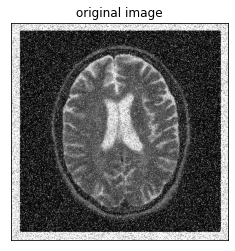

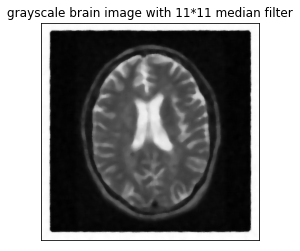

In [7]:
# 1.5
# As the brainNoisy.jpg image contains both salt and pepper noise, so we should use median filter for it.
original_img = cv2.imread('../images/brainNoisy.jpg')
original_img = colored_to_gray(original_img)
plt.imshow(original_img,cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

# we have to use filter of size 11 to remove most of the salt noise from the image
t,op_img = optimised_median_filter(original_img,11)
plt.imshow(op_img,cmap='gray')
plt.title('grayscale brain image with 11*11 median filter')
plt.xticks([]), plt.yticks([]) 
plt.show()

In [103]:
def canny(img):
    op_img = cv2.Canny(img,255,700)
    plt.imshow(op_img, cmap='gray')
    plt.title('Canny Edge Detection')
    plt.xticks([]), plt.yticks([]) 
    plt.show()

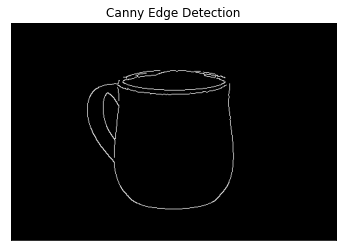

In [104]:
# 2.1, 2.2
img = cv2.imread('../images/cup.jpg')
canny(img)

In [3]:
# Our filtering function (assuming that im is already padded)
# It converts the matrix to a 4-d array
# im => image or input
# fil => filter
# return filtred image
def filter(im, fil):
    fil = np.array(fil)
    # Get the shape of the 4d array needed for filtering     
    view_shape = tuple(np.subtract(im.shape, fil.shape) + 1) + fil.shape
    strd = np.lib.stride_tricks.as_strided
    # Get the new view of the array as required for filtering     
    subM = strd(im, shape = view_shape, strides = im.strides * 2)
    # for every i,j element in filter with <k,l> 2d array of subM
    # and return thier sum of as an i,j 2d array   
    return np.einsum('ij,ijkl->kl',fil,subM.T).T

In [4]:
def gradient_filters(img, fil_x, fil_y, filter_name):
    img_x = filter(img,fil_x)
    img_y = filter(img,fil_y)
    
    fig = plt.figure(figsize=(8,8))
    ax1 = fig.add_subplot(2,2,1)
    ax1.imshow(img, cmap='gray')
    ax1.axis('off')
    ax1.set_title('original image')

    ax2 = fig.add_subplot(2,2,2)
    ax2.imshow(img_x, cmap='gray')
    ax2.axis('off')
    ax2.set_title('Mx')

    ax3 = fig.add_subplot(2,2,3)
    ax3.imshow(img_y, cmap='gray')
    ax3.axis('off')
    ax3.set_title('My')
    
    ax4 = fig.add_subplot(2,2,4)
    ax4.imshow(np.sqrt(img_y**2 + img_x**2) , cmap='gray')
    ax4.axis('off')
    ax4.set_title(filter_name)

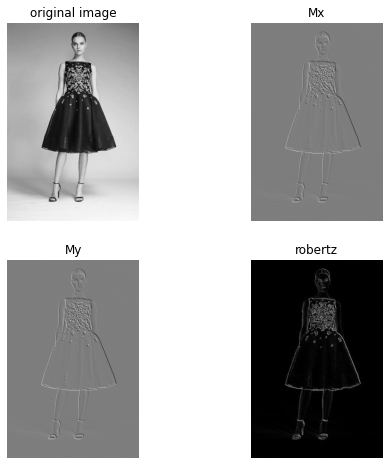

In [96]:
# 2.3
img = Image.open('../images/girl.jpg').convert('L')
img = np.array(img)

# Robertz Filter
def robertz(img):
    Mx = [[0,1], 
          [-1,0]]
    My = [[0,1],
          [-1,0]]
    gradient_filters(img,Mx,My,'robertz')
    
robertz(img)

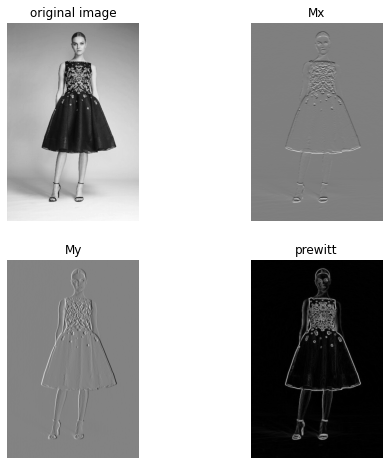

In [97]:
# Prewitt Filter
def prewitt(img):
    Mx = [[-1,0,1], 
          [-1,0,1],
          [-1,0,1]]
    My = [[1,1,1], 
          [0,0,0],
          [-1,-1,-1]]
    gradient_filters(img,Mx,My,'prewitt')
    
prewitt(img)

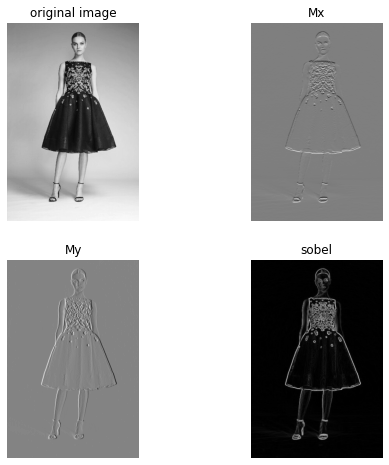

In [98]:
# Sobel Filter
def sobel(img):
    Mx = [[-1,0,1], 
          [-2,0,2],
          [-1,0,1]]
    My = [[1,2,1], 
          [0,0,0],
          [-1,-2,-1]]
    gradient_filters(img,Mx,My,'sobel')
    
sobel(img)

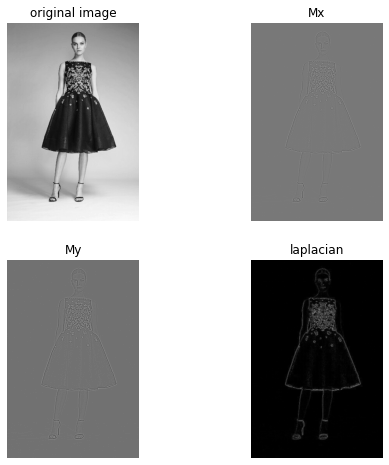

In [99]:
# Laplacian Filter
def laplacian(img):
    Mx = [[0,-1,0], 
          [-1,4,-1],
          [0,-1,0]]
    My = [[-1,-1,-1], 
          [-1,8,-1],
          [-1,-1,-1]]

    gradient_filters(img,Mx,My,'laplacian')
    
laplacian(img)
# ignore the 4th image

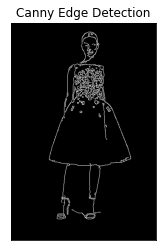

In [89]:
# Canny Edge Detection
img = cv2.imread('../images/girl.jpg')
canny(img)

# Observation
It has been observed that that the Canny edge detector produces higher accuracy in detection of object edges
with accuracy compared with Sobel, Roberts, Prewitt, Laplacian.

Approx accuracy measure:
Canny > Sobel ~ Prewitt ~ Laplacian > Roberts

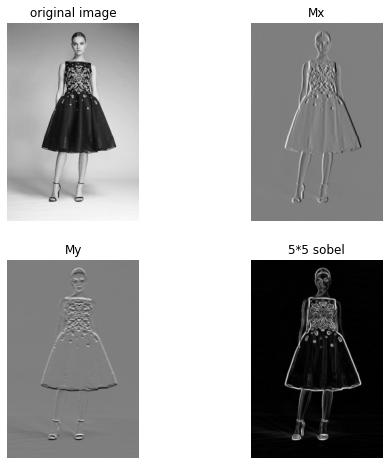

In [100]:
# 2.4
img = Image.open('../images/girl.jpg').convert('L')
img = np.array(img)

# 5*5 Sobel Filter
def large_sobel(img):
    Mx = [[2,2,4,2,2],
         [1,1,2,1,1],
         [0,0,0,0,0],
         [-1,-1,-2,-1,-1],
         [-2,-2,-4,-2,-2]]
    My = [[2,1,0,-1,-2],
         [2,1,0,-1,-2],
         [4,2,0,-2,-4],
         [2,1,0,-1,-2],
         [2,1,0,-1,-2]]
    gradient_filters(img,Mx,My,'5*5 sobel')
    
large_sobel(img)

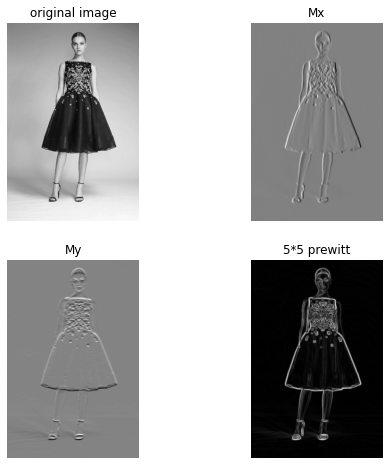

In [101]:
# 5*5 Prewitt filter
def large_prewitt(img):
    Mx = [[9,9,9,9,9],
         [9,5,5,5,9],
         [-7,-3,0,-3,-7],
         [-7,-3,-3,-3,-7],
         [-7,-7,-7,-7,-7]]

    My = [[9,9,-7,-7,-7],
         [9,5,-3,-3,-7],
         [9,5,0,-3,-7],
         [9,5,-3,-3,-7],
         [9,9,-7,-7,-7]]
    gradient_filters(img,Mx,My,'5*5 prewitt')
    
large_prewitt(img)

# Observation
As the Kernel size increases, more pixels are now a part of the convolution process. This signifies that the gradient map (edges) will tend to get blurry to a point the output looks likes a plastic cover has been wrapped
around the edges. 

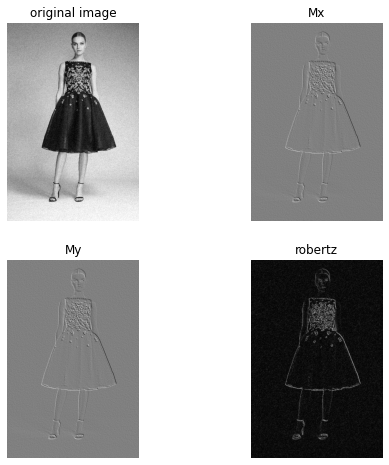

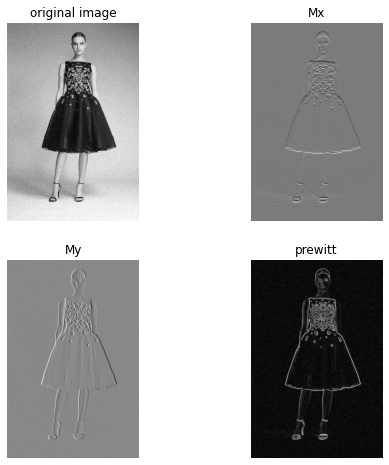

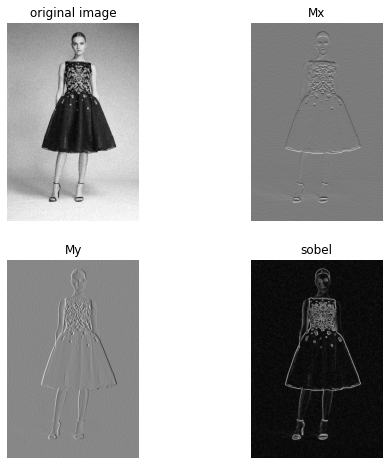

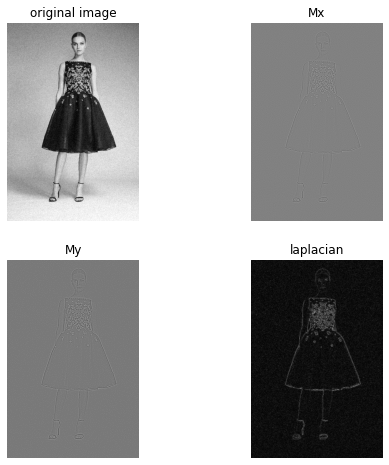

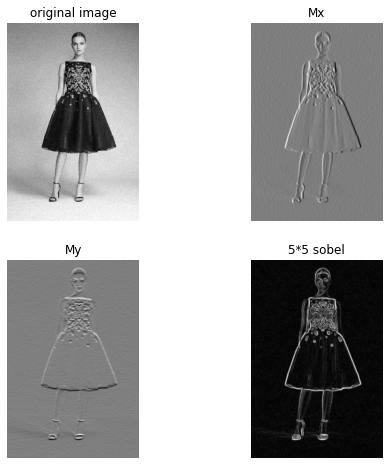

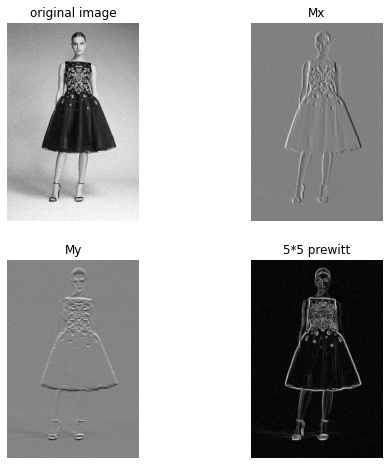

In [102]:
# 2.5
# girlNoisy1
img = Image.open('../images/girlNoisy1.jpg').convert('L')
img = np.array(img)

robertz(img)
prewitt(img)
sobel(img)
laplacian(img)
large_sobel(img)
large_prewitt(img)

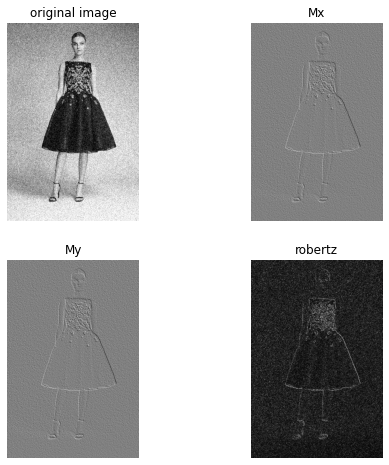

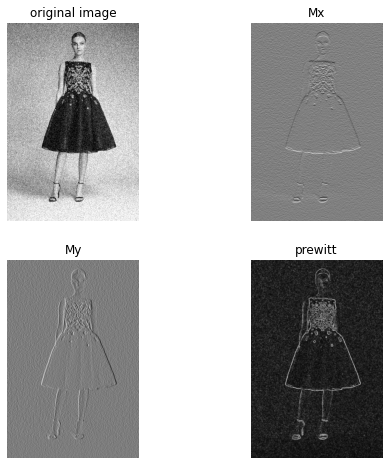

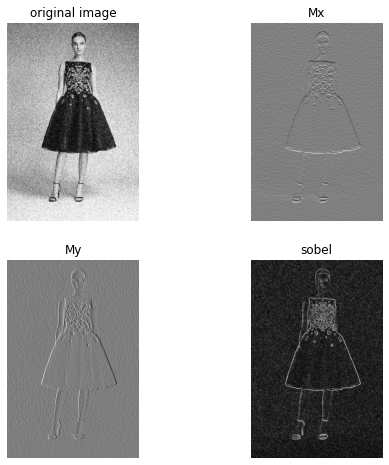

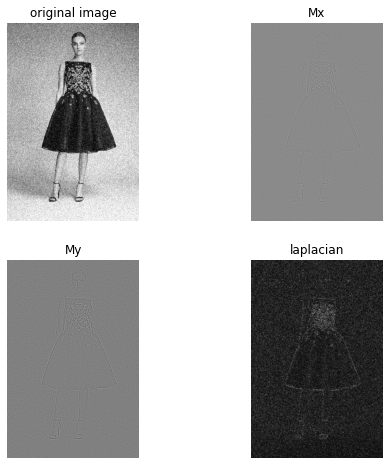

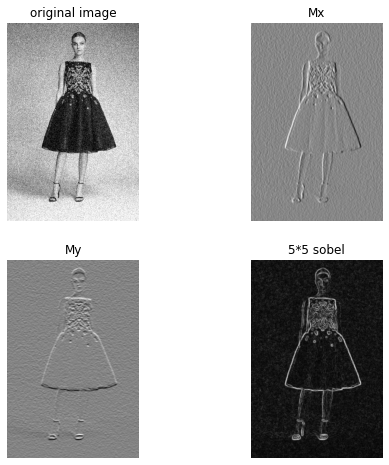

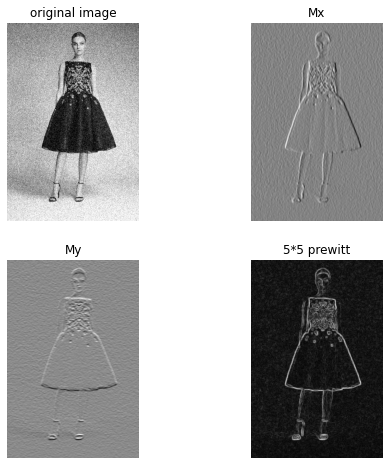

In [103]:
# girlNoisy2
img = Image.open('../images/girlNoisy2.jpg').convert('L')
img = np.array(img)

robertz(img)
prewitt(img)
sobel(img)
laplacian(img)
large_sobel(img)
large_prewitt(img)

# Observation
Edge detection in noisy images is a bargain between denoising and edge preserving capability. As in girlNoisy2, noise is increased, and the edges in this case appears quite thick whereas in penultimate case the edges were thinner. So there exists are tradeoff between denoising and edge preserving.

In [3]:
def gen_gaussian_kernel(k_size, sigma):
    center = k_size // 2
    x, y = mgrid[0 - center : k_size - center, 0 - center : k_size - center]
    g = 1 / (2 * pi * sigma) * exp(-(square(x) + square(y)) / (2 * square(sigma)))
    return g

In [4]:
def gaussian_filter(image, k_size, sigma):
    height, width = image.shape[0], image.shape[1]
    # dst image height and width
    dst_height = height - k_size + 1
    dst_width = width - k_size + 1

    # im2col, turn the k_size*k_size pixels into a row and np.vstack all rows
    image_array = zeros((dst_height * dst_width, k_size * k_size))
    row = 0
    for i, j in product(range(dst_height), range(dst_width)):
        window = ravel(image[i : i + k_size, j : j + k_size])
        image_array[row, :] = window
        row += 1

    #  turn the kernel into shape(k*k, 1)
    gaussian_kernel = gen_gaussian_kernel(k_size, sigma)
    filter_array = ravel(gaussian_kernel)

    # reshape and get the dst image
    dst = dot(image_array, filter_array).reshape(dst_height, dst_width).astype(uint8)

    return dst

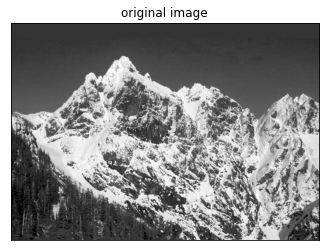

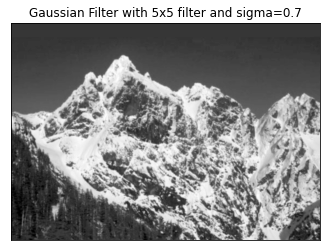

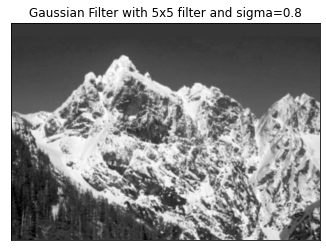

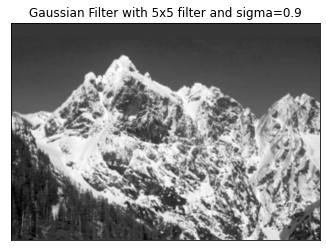

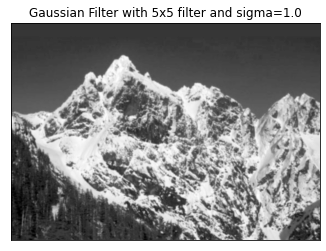

In [5]:
# 3.1
# From gonalezwoods, we know that k=ceil(6*sigma) covers 99% of area of gaussian curve.
# here k=5, so we will vary our sigma from 0.7 to 1
img = imread(r"../images/mountain.png")
gray = cvtColor(img, COLOR_BGR2GRAY)
plt.imshow(gray, cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

gaussian1 = gaussian_filter(gray, 5, sigma=0.7)
gaussian2 = gaussian_filter(gray, 5, sigma=0.8)
gaussian3 = gaussian_filter(gray, 5, sigma=0.9)
gaussian4 = gaussian_filter(gray, 5, sigma=1.0)


plt.imshow(gaussian1, cmap='gray')
plt.title('Gaussian Filter with 5x5 filter and sigma=0.7')
plt.xticks([]), plt.yticks([]) 
plt.show()

plt.imshow(gaussian2, cmap='gray')
plt.title('Gaussian Filter with 5x5 filter and sigma=0.8')
plt.xticks([]), plt.yticks([]) 
plt.show()

plt.imshow(gaussian2, cmap='gray')
plt.title('Gaussian Filter with 5x5 filter and sigma=0.9')
plt.xticks([]), plt.yticks([]) 
plt.show()

plt.imshow(gaussian2, cmap='gray')
plt.title('Gaussian Filter with 5x5 filter and sigma=1.0')
plt.xticks([]), plt.yticks([]) 
plt.show()

# Observation
As sigma is increased blurring of the image increases

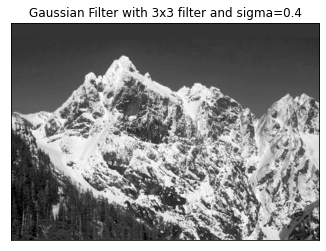

In [6]:
# From gonalezwoods, we know that k=ceil(6*sigma) covers 99% of area of gaussian curve.
# let's vary filter sizes from 3*3,5*5,7*7

# 3*3
img = imread(r"../images/mountain.png")
gray = cvtColor(img, COLOR_BGR2GRAY)

gaussian = gaussian_filter(gray, 3, sigma=0.4)

plt.imshow(gaussian, cmap='gray')
plt.title('Gaussian Filter with 3x3 filter and sigma=0.4')
plt.xticks([]), plt.yticks([]) 
plt.show()

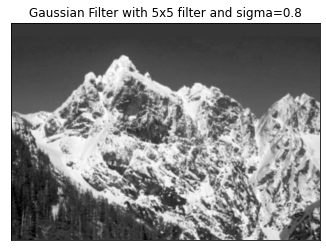

In [7]:
# 5*5
img = imread(r"../images/mountain.png")
gray = cvtColor(img, COLOR_BGR2GRAY)

gaussian = gaussian_filter(gray, 5, sigma=0.8)

plt.imshow(gaussian, cmap='gray')
plt.title('Gaussian Filter with 5x5 filter and sigma=0.8')
plt.xticks([]), plt.yticks([]) 
plt.show()

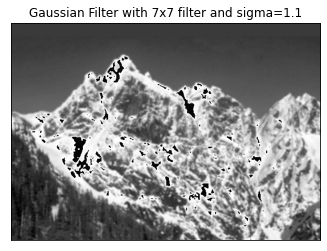

In [8]:
# 7*7
img = imread(r"../images/mountain.png")
gray = cvtColor(img, COLOR_BGR2GRAY)

gaussian = gaussian_filter(gray, 7, sigma=1.1)

plt.imshow(gaussian, cmap='gray')
plt.title('Gaussian Filter with 7x7 filter and sigma=1.1')
plt.xticks([]), plt.yticks([]) 
plt.show()


In [14]:
def bilateral_filter(img, sigma_d, sigma_r, sz):
    gaussian_kernel = np.zeros((sz, sz))
    res = np.zeros(img.shape)
    img = img.astype(np.float64)
    rows = img.shape[0]
    cols = img.shape[1]
    for i in range(sz):
        for j in range(sz):
                gaussian_kernel[i][j] = np.exp(-(((i - int(sz / 2)) * (i - int(sz / 2))) + ((j - int(sz / 2)) * (j - int(sz / 2))) ) / (2 * sigma_d * sigma_d))
    for i in range(int(sz / 2), rows - int(sz / 2)):
        for j in range(int(sz / 2), cols - int(sz / 2)):
            for k in range(3):
                l_r = i - int(sz / 2)
                r_r = i + int(sz / 2)
                l_c = j - int(sz / 2)
                r_c = j + int(sz / 2)
                subpart = img[l_r : r_r + 1, l_c : r_c + 1, k : k + 1].reshape(sz, -1)
                second_component = img[l_r : r_r + 1, l_c : r_c + 1, k : k + 1].reshape(sz, -1) - img[i][j][k]
                range_component = second_component * second_component
                range_component = range_component / (2 * sigma_r * sigma_r)
                range_component = np.exp(-range_component)
                kernel = gaussian_kernel * range_component
                s = sum(sum(kernel))
                res[i][j][k] = (sum(sum(subpart * kernel))) / s
    return res.astype('uint8')

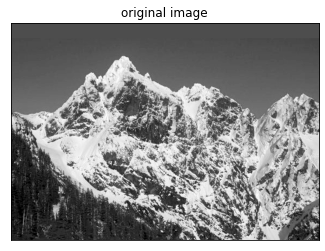

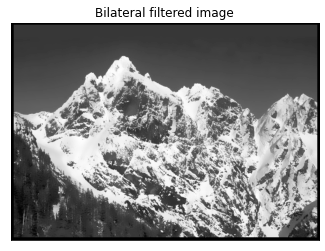

In [9]:
# 3.2
img = cv2.cvtColor(cv2.imread('../images/mountain.png'), cv2.COLOR_BGR2RGB)
op_img = bilateral_filter(img, 1000, 20, 11)

plt.imshow(colored_to_gray(cv2.imread('../images/mountain.png')), cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

plt.imshow(colored_to_gray(op_img), cmap='gray')
plt.title('Bilateral filtered image')
plt.xticks([]), plt.yticks([]) 
plt.show()

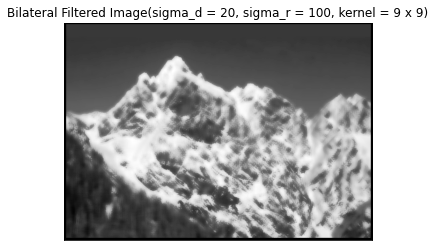

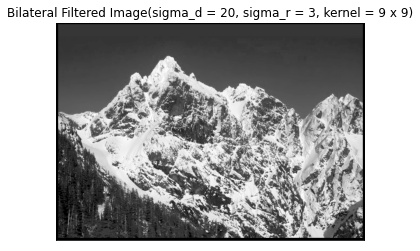

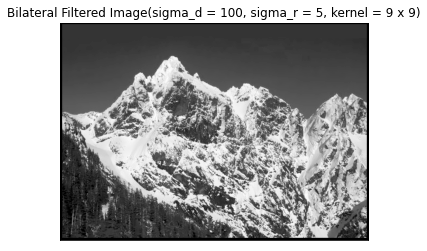

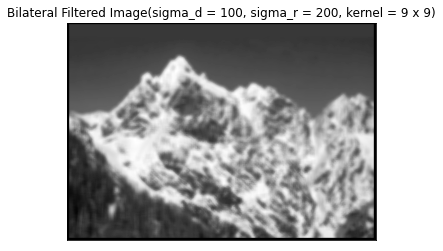

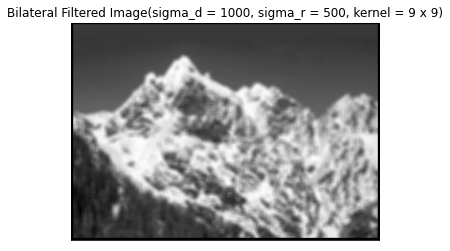

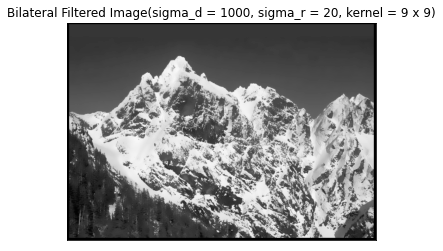

In [75]:
# 3.3
s1 = [20, 20, 100, 100, 1000, 1000]
s2 = [100, 3, 5, 200, 500, 20]
img = cv2.cvtColor(cv2.imread('../images/mountain.png'), cv2.COLOR_BGR2RGB)
for i in range(len(s1)):
    op_img = bilateral_filter(img, s1[i], s2[i], 9)
    plt.imshow(colored_to_gray(op_img), cmap='gray')
    plt.title('Bilateral Filtered Image(sigma_d = ' + str(s1[i]) + ', sigma_r = ' + str(s2[i]) + ', kernel = 9 x 9)')
    plt.xticks([]), plt.yticks([]) 
    plt.show()

# Observation
As sigma_r is increased gaussian blurring increases.

As singma_d is increased, edges are more preserved of the given image.

When both of the sigma's are increased to too much extent, then image becomes too blury.

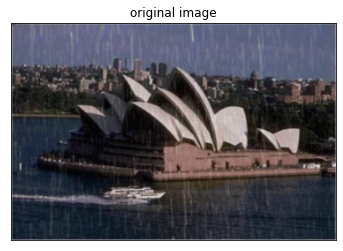

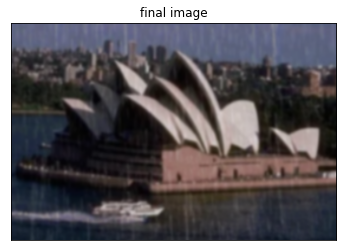

In [13]:
# 4.1
img = cv2.imread('../images/rain.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

h,w,c = img.shape

# r,g,b image
red = np.zeros((h, w), img.dtype)
green = np.zeros((h, w), img.dtype)
blue = np.zeros((h, w), img.dtype)

for i in range(h):
    for j in range(w):
        red[i,j] = img[i,j,0]
        green[i,j] = img[i,j,1]
        blue[i,j] = img[i,j,2]

window_size = 51
val = 1
gauss_red = gaussian_filter(red, window_size, sigma=val)
gauss_green = gaussian_filter(green, window_size, sigma=val)
gauss_blue = gaussian_filter(blue, window_size, sigma=val)

gauss_red = cv2.resize(gauss_red, (w,h))
gauss_green = cv2.resize(gauss_green, (w,h))
gauss_blue = cv2.resize(gauss_blue, (w,h))

op_img = np.zeros((h, w, c), img.dtype)
for i in range(h):
    for j in range(w):
        op_img[i,j,0] = gauss_red[i,j]
        op_img[i,j,1] = gauss_green[i,j]
        op_img[i,j,2] = gauss_blue[i,j]

plt.imshow(op_img)
plt.title('final image')
plt.xticks([]), plt.yticks([]) 
plt.show()

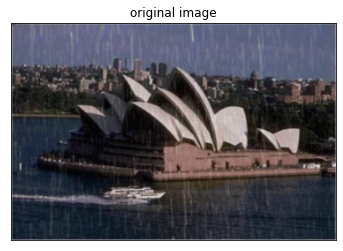

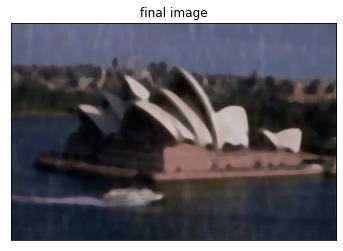

In [164]:
# 4.2
plt.imshow(img)
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

med_red = np.array(red)
med_green = np.array(green)
med_blue = np.array(blue)

window_size = 7
t,med_red = optimised_median_filter(med_red,window_size)
t,med_green = optimised_median_filter(med_green,window_size)
t,med_blue = optimised_median_filter(med_blue,window_size)

med_red = cv2.resize(med_red, (w,h))
med_green = cv2.resize(med_green, (w,h))
med_blue = cv2.resize(med_blue, (w,h))

op_img = np.zeros((h, w, c), img.dtype)
for i in range(h):
    for j in range(w):
        op_img[i,j,0] = med_red[i,j]
        op_img[i,j,1] = med_green[i,j]
        op_img[i,j,2] = med_blue[i,j]

plt.imshow(op_img)
plt.title('final image')
plt.xticks([]), plt.yticks([]) 
plt.show()

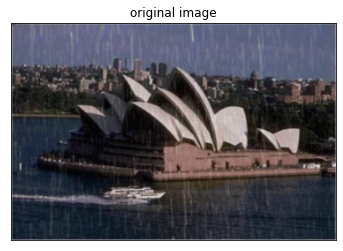

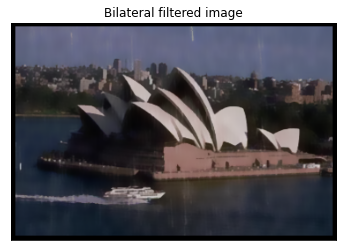

In [15]:
# 4.3
img = cv2.cvtColor(cv2.imread('../images/rain.png'), cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

op_img = bilateral_filter(img, 1000, 20, 11)
plt.imshow(op_img)
plt.title('Bilateral filtered image')
plt.xticks([]), plt.yticks([]) 
plt.show()

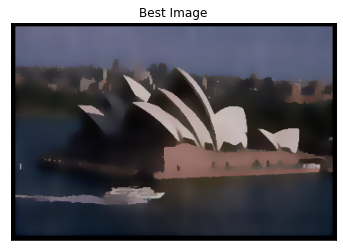

In [17]:
op_img = bilateral_filter(op_img, 1000, 20, 11)
plt.imshow(op_img)
plt.title('Best Image')
plt.xticks([]), plt.yticks([]) 
plt.show()

# Observation
Accuracy of filters in removing rain from the image: Bilateral Filter > Median Filter > Gaussian Filter
In Bilateral Filtered Image, the final image looks much closer to the desired output.

In [35]:
# 5
def cartoon_creation(path):
    img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('original image')
    plt.xticks([]), plt.yticks([]) 
    plt.show()

    # applying bilateral filter
    temp_img = bilateral_filter(img, 20, 100, 9)

    # converting to gray scale
    gray = cvtColor(temp_img, COLOR_BGR2GRAY)

    # blurring using gaussian filter
    gauss = gaussian_filter(gray, 5, sigma=1)

    h, w = gauss.shape
    p = 1
    kernel = [
                [1,2,1],
                [2,4,2],
                [1,2,1]
            ]
    edge_mask = np.zeros((h, w), img.dtype)
    for p1 in range(h):
        for p2 in range(w):
            sum = 0
            for i in range(-p,p+1):
                for j in range(-p,p+1):
                    if p1+i>=0 and p1+i<h and p2+j>=0 and p2+j<w:
                        sum+=(kernel[i+1][j+1]*gauss[p1+i,p2+j])

            sum = sum // 16
            if sum>=gauss[p1,p2]:
                edge_mask[p1,p2] = 255
            else:
                edge_mask[p1,p2] = 125

    h, w, c = img.shape
    edge_mask = cv2.resize(edge_mask, (w,h))

    op_img = np.zeros((h, w,c), temp_img.dtype)
    for i in range(h):
        for j in range(w):
            for k in range(c):
                op_img[i,j,k] = (temp_img[i,j,k] & edge_mask[i,j])


    plt.imshow(op_img)
    plt.title('cartoon image')
    plt.xticks([]), plt.yticks([]) 
    plt.show()

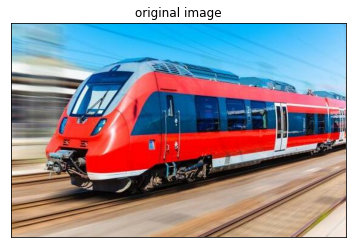

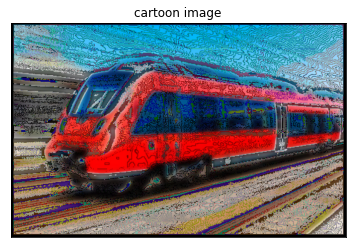

In [36]:
# applying cartoon creation on train image
cartoon_creation('../images/train.jpg')

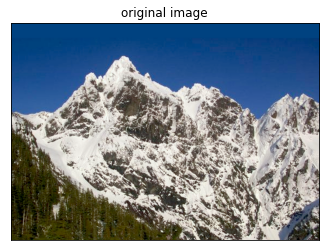

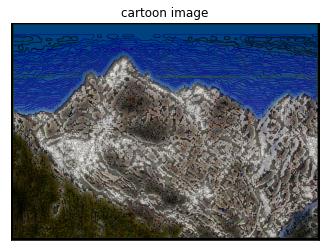

In [38]:
# applying cartoon creation on mountain image
cartoon_creation('../images/mountain.png')

In [8]:
# 6
def convolve(im, k):
    im = im.astype(np.float64)
    k = k.astype(np.float64)
    rows = im.shape[0]
    cols = im.shape[1]
    k_r = k.shape[0]
    k_c = k.shape[1]
    res = np.zeros(im.shape)
    for i in range(int(k_r/2), rows - int((k_r-1) / 2)):
        for j in range(int(k_c/2), cols - int((k_c - 1) / 2)):
            l_r = i - int(k_r / 2)
            r_r = i + int((k_r - 1) / 2)
            l_c = j - int(k_c / 2)
            r_c = j + int((k_c - 1) / 2)
            res[i][j] = max(0, sum(sum(k * im[l_r : r_r + 1, l_c : r_c + 1])))
    return res.astype(np.int)

In [9]:
def high_boost_filter(size, A):
    kernel = np.ones((size, size))
    kernel[int(size / 2)][int(size / 2)] = 0
    kernel = -kernel
    kernel[int(size / 2)][int(size / 2)] = (size * size * A) - 1
    return kernel

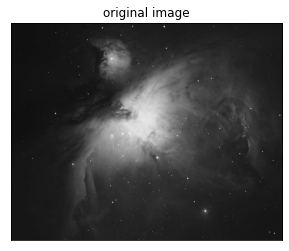

In [10]:
img = cv2.imread('../images/orion.jpg', cv2.IMREAD_GRAYSCALE)
plt.imshow(img, cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

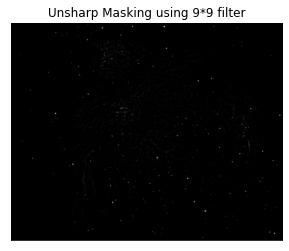

In [11]:
# 6.1
# for unsharp masking k=1 and filter of size 9*9
kernel = high_boost_filter(9, 1)
op_img = convolve(img, kernel)
plt.imshow(op_img, cmap='gray')
plt.title('Unsharp Masking using 9*9 filter')
plt.xticks([]), plt.yticks([]) 
plt.show()

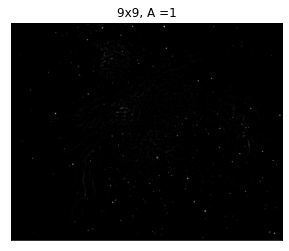

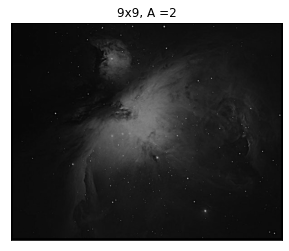

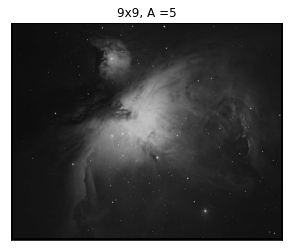

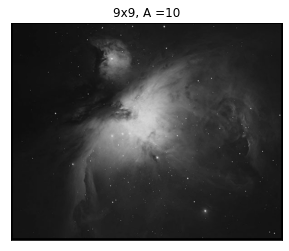

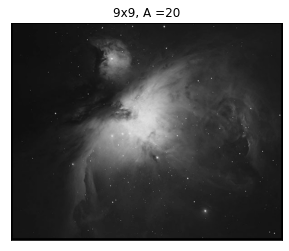

In [12]:
# 6.2
# using filter size of 9*9
for i in [1, 2, 5, 10, 20]:
    kernel = high_boost_filter(9, i)
    op_img = convolve(img, kernel)
    plt.imshow(op_img, cmap='gray')
    plt.title('9x9, A =' + str(i))
    plt.xticks([]), plt.yticks([]) 
    plt.show()

# Observation
As we increase the value of A in highboost filtering, sharpness of image increases and brightness also increases

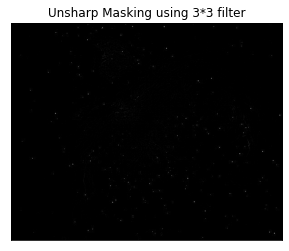

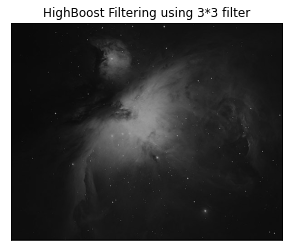

In [13]:
# 6.3
# using filters of size 3*3,5*5,7*7 and k=2 for highbosst filtering
# 3*3
kernel = high_boost_filter(3, 1)
op_img = convolve(img, kernel)
plt.imshow(op_img, cmap='gray')
plt.title('Unsharp Masking using 3*3 filter')
plt.xticks([]), plt.yticks([]) 
plt.show()

kernel = high_boost_filter(3, 2)
op_img = convolve(img, kernel)
plt.imshow(op_img, cmap='gray')
plt.title('HighBoost Filtering using 3*3 filter')
plt.xticks([]), plt.yticks([]) 
plt.show()

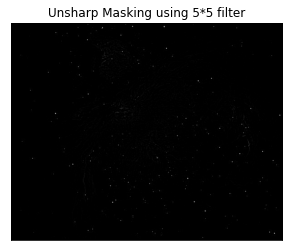

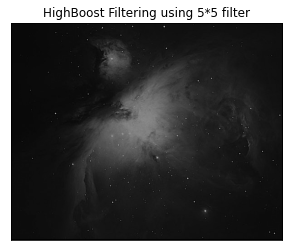

In [14]:
# 5*5
kernel = high_boost_filter(5, 1)
op_img = convolve(img, kernel)
plt.imshow(op_img, cmap='gray')
plt.title('Unsharp Masking using 5*5 filter')
plt.xticks([]), plt.yticks([]) 
plt.show()

kernel = high_boost_filter(5, 2)
op_img = convolve(img, kernel)
plt.imshow(op_img, cmap='gray')
plt.title('HighBoost Filtering using 5*5 filter')
plt.xticks([]), plt.yticks([]) 
plt.show()

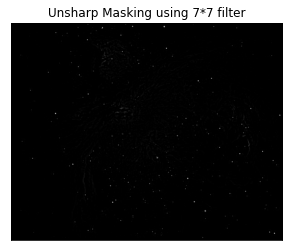

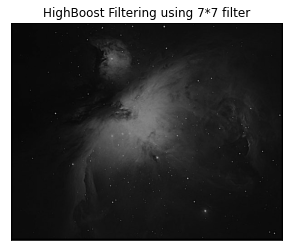

In [15]:
# 7*7
kernel = high_boost_filter(7, 1)
op_img = convolve(img, kernel)
plt.imshow(op_img, cmap='gray')
plt.title('Unsharp Masking using 7*7 filter')
plt.xticks([]), plt.yticks([]) 
plt.show()

kernel = high_boost_filter(7, 2)
op_img = convolve(img, kernel)
plt.imshow(op_img, cmap='gray')
plt.title('HighBoost Filtering using 7*7 filter')
plt.xticks([]), plt.yticks([]) 
plt.show()

# Observation
As filter size is increased blurring effect also increases somewhat

In [26]:
def oneFft(x):
    x = np.asarray(x, dtype=float)
    N = len(x)
    if np.log2(N) % 1 > 0:
        raise ValueError("must be a power of 2")
        
    N_min = min(N, 2)
    n = np.arange(N_min)
    k = n[:, None]
    M = np.exp(-2j * np.pi * n * k / N_min)
    X = np.dot(M, x.reshape((N_min, -1)))
    while X.shape[0] < N:
            X_even = X[:, :int(X.shape[1] / 2)]
            X_odd = X[:, int(X.shape[1] / 2):]
            terms = np.exp(-1j * np.pi * np.arange(X.shape[0])
                            / X.shape[0])[:, None]
            X = np.vstack([X_even + terms * X_odd,
                           X_even - terms * X_odd])
    return X.ravel()

def oneDft(x):
    x = np.asarray(x, dtype=float)
    N = x.shape[0]
    n = np.arange(N)
    k = n.reshape((N, 1))
    M = np.exp(-2j * np.pi * k * n / N)
    return np.dot(M, x)

def twoDft(x):
    start = time.time()
    transform = np.zeros((x.shape[0],x.shape[1]),dtype=complex)
    for i in range(len(x)):
        transform[i] = oneFft(x[i])
    transform = np.transpose(transform)
    temp = np.zeros((x.shape[1],x.shape[0]),dtype=complex)
    for i in range(x.shape[1]):
        temp[i] = np.fft.fft(transform[i])
    transform = np.transpose(temp)
    end = time.time()
    return end-start,transform

def twoFft(x):
    start = time.time()
    transform = np.zeros((x.shape[0],x.shape[1]),dtype=complex)
    for i in range(len(x)):
        transform[i] = oneFft(x[i])
    transform = np.transpose(transform)
    temp = np.zeros((x.shape[1],x.shape[0]),dtype=complex)
    for i in range(x.shape[1]):
        temp[i] = np.fft.fft(transform[i])
    transform = np.transpose(temp)
    end = time.time()
    return end-start,transform


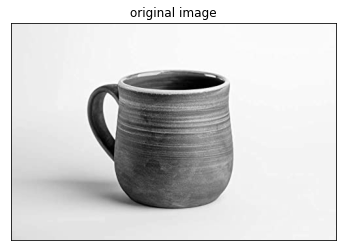

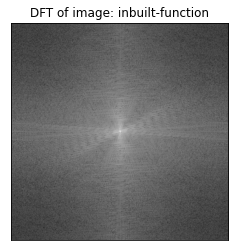

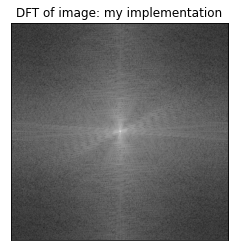

In [27]:
# 7.1 
img = cv2.imread('../images/cup.jpg',0)
plt.imshow(img, cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

l = max(img.shape[0], img.shape[1])
if np.log2(l) != int:
    l = 2**int(np.log2(l)+1)

img = cv2.resize(img, (l, l))

# built-in implementation of dft
img_float32 = np.float32(img)
temp = cv2.dft(img_float32, flags = cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(temp)
magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('DFT of image: inbuilt-function')
plt.xticks([]), plt.yticks([]) 
plt.show()

t, dft = twoDft(img)
plt.imshow(np.log(1 + np.abs(np.fft.fftshift(dft))), cmap='gray')
plt.title('DFT of image: my implementation')
plt.xticks([]), plt.yticks([]) 
plt.show()

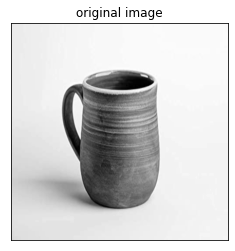

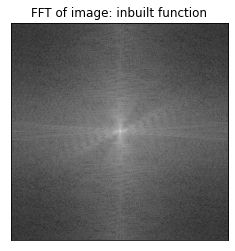

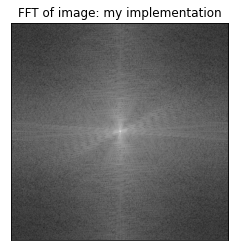

In [28]:
# 7.2
plt.imshow(img, cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

plt.imshow(np.log(1 + np.abs(np.fft.fftshift(np.fft.fft2(img)))), cmap='gray')
plt.title('FFT of image: inbuilt function')
plt.xticks([]), plt.yticks([]) 
plt.show()

t,fft = twoFft(img)
plt.imshow(np.log(1 + np.abs(np.fft.fftshift(fft))), cmap='gray')
plt.title('FFT of image: my implementation')
plt.xticks([]), plt.yticks([]) 
plt.show()

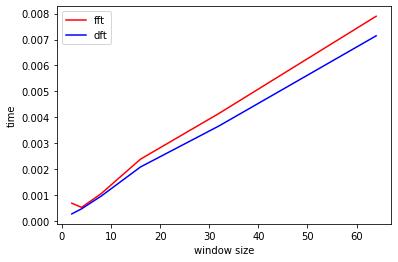

In [30]:
# graph plotting
img_dims = 2
x = []
y_fft = []
y_dft = []
while img_dims<=64:
    x.append(img_dims)
    new_img = cv2.resize(img, (img_dims,img_dims))

    t,op_img = twoFft(new_img)
    y_fft.append(t)

    t,dft = twoDft(new_img)
    y_dft.append(t)

    img_dims *= 2

plt.plot(x,y_fft, color = 'red')
plt.plot(x,y_dft, color = 'blue')
plt.legend(['fft','dft'])
plt.xlabel('window size')
plt.ylabel('time')
plt.show()

In [31]:
def oneIFft(x):
    N = len(x)
    wt = cmath.exp(2j*math.pi/N)
    if N > 1:
        y = oneIFft(x[::2])
        z = oneIFft(x[1::2])
        x = y + z
        for k in range(0,N//2):
            tt = x[k]
            x[k] = tt + (wt**k)*x[k+N//2]
            x[k+N//2] = tt - (wt**k)*x[k+N//2]
    return x

def twoIFft(x):
    transform = np.zeros((x.shape[0],x.shape[1]),dtype=complex)
    for i in range(len(x)):
        transform[i] = oneIFft(x[i].tolist())
        transform[i] /= len(transform[i])
    transform = np.transpose(transform)
    for i in range(len(x[0])):
        transform[i] = oneIFft(transform[i].tolist())
        transform[i] /= len(transform[i])
    transform = np.transpose(transform)
    return transform

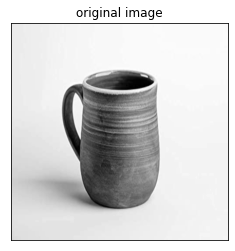

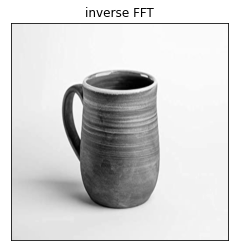

In [34]:
# 7.3
plt.imshow(img, cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

ifft = twoIFft(fft)
plt.imshow(ifft.real, cmap='gray')
plt.title('inverse FFT')
plt.xticks([]), plt.yticks([]) 
plt.show()

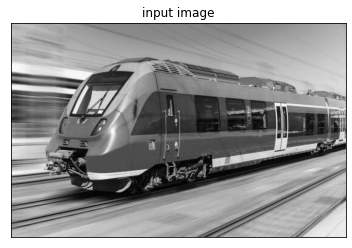

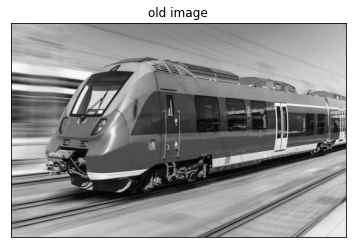

In [4]:
# 7.4
# Take 2d fft and take the conjugate to correct the image
img = cv2.imread('../images/train.jpg', cv2.IMREAD_GRAYSCALE)
f = np.fft.fft2(img)
f = np.conjugate(f)
f = np.fft.fft2(f)

old_img = np.real(f)

# Plot image and fft
plt.imshow(img, cmap='gray')
plt.title('input image')
plt.xticks([]), plt.yticks([]) 
plt.show()

plt.imshow(old_img, cmap='gray')
plt.title('old image')
plt.xticks([]), plt.yticks([]) 
plt.show()

In [6]:
# 8.1
# only keeps frequencies below cut_off and sets rest frequencies to 0
def ideal_low_pass(img_path,cut_off):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    
    plt.imshow(img, cmap='gray')
    plt.title('original image')
    plt.xticks([]), plt.yticks([]) 
    plt.show()

    # taking FFT of our image so that we can get the frequecny domain of our image     
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.log(np.abs(fshift))
    new_transform = np.copy(fshift)
    rows = new_transform.shape[0]
    cols = new_transform.shape[1]
    for i in range(rows):
        for j in range(cols):
            # distance from the center             
            if np.sqrt((i - (rows / 2)) * (i - (rows / 2)) + (j - (cols / 2)) * (j - (cols / 2))) <= cut_off:
                new_transform[i][j] = fshift[i][j]  #if dist<cut_off then only we are keeping the frequency.
            else:
                new_transform[i][j] = 0

    # taking fourier inverse to get the original image back     
    f_ishift = np.fft.ifftshift(new_transform)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.abs(img_back)
    
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title('frequency spectrum of original image')
    plt.xticks([]), plt.yticks([]) 
    plt.show()
    
    plt.imshow(np.log(1 + np.abs(new_transform)), cmap='gray')
    plt.title('modified frequency spectrum')
    plt.xticks([]), plt.yticks([]) 
    plt.show()
    
    plt.imshow(img_back, cmap='gray')
    plt.title('reconstructed image')
    plt.xticks([]), plt.yticks([]) 
    plt.show()

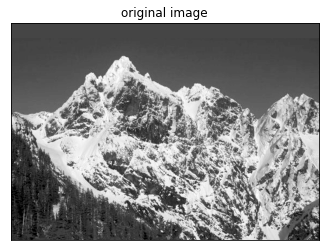

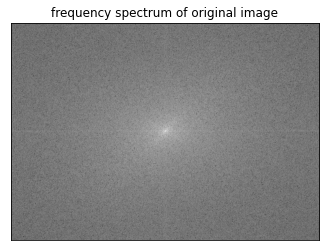

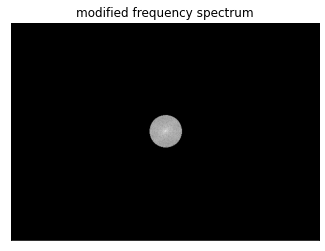

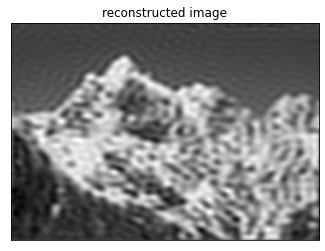

In [7]:
img_path = '../images/mountain.png'
ideal_low_pass(img_path,30)

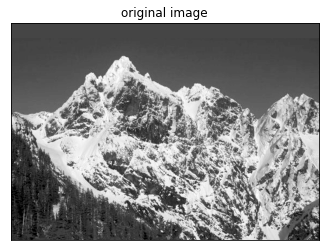

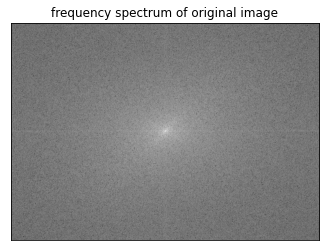

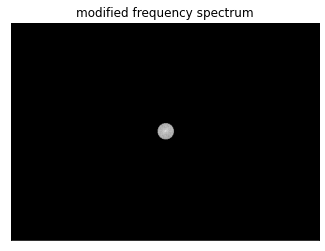

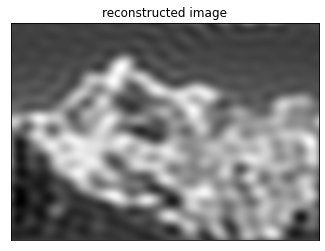

In [8]:
ideal_low_pass(img_path,15)

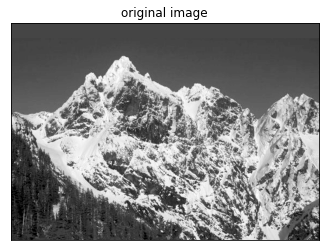

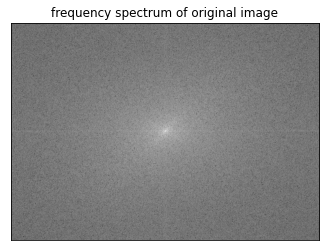

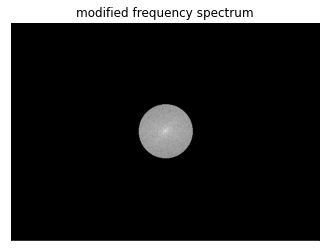

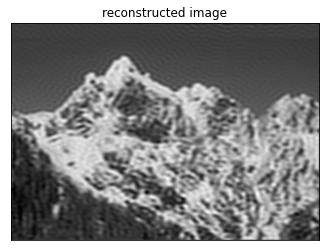

In [9]:
ideal_low_pass(img_path,50)

# Observation
As cutoff radius is increased, then more number of frequencies are allowed to pass, that's why blurring decreases.

Blurring and cut_off radius are inversely proportional

In [10]:
# 8.2
# same steps followed as in ideal low-pass. H ( u , v ) = e −(D( u , v )) ^ 2 / (2* D0) ^ 2
def gaussian_lowpass(img_path,cut_off):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    
    plt.imshow(img, cmap='gray')
    plt.title('original image')
    plt.xticks([]), plt.yticks([]) 
    plt.show()
    
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.log(np.abs(fshift))
    new_transform = np.copy(fshift)
    rows = new_transform.shape[0]
    cols = new_transform.shape[1]
    for i in range(rows):
        for j in range(cols):
            D = np.sqrt((i - (rows / 2)) * (i - (rows / 2)) + (j - (cols / 2)) * (j - (cols / 2))) 
            new_transform[i][j] = np.exp(-(D * D) / (2 * cut_off * cut_off)) * fshift[i][j]

    f_ishift = np.fft.ifftshift(new_transform)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.abs(img_back)
    
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title('frequency spectrum of original image')
    plt.xticks([]), plt.yticks([]) 
    plt.show()
    
    plt.imshow(np.log(1 + np.abs(new_transform)), cmap='gray')
    plt.title('modified frequency spectrum')
    plt.xticks([]), plt.yticks([]) 
    plt.show()
    
    plt.imshow(img_back, cmap='gray')
    plt.title('reconstructed image')
    plt.xticks([]), plt.yticks([]) 
    plt.show()

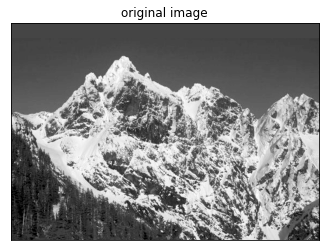

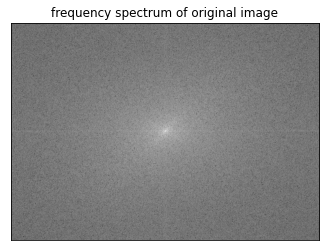

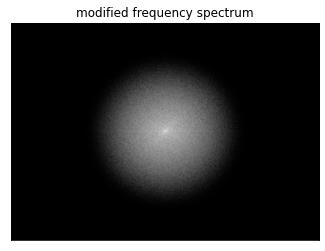

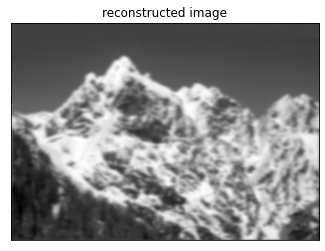

In [11]:
img_path = '../images/mountain.png'
gaussian_lowpass(img_path,30)

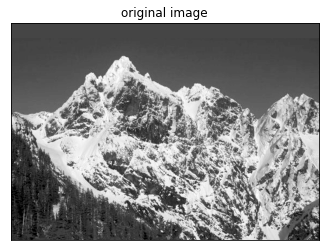

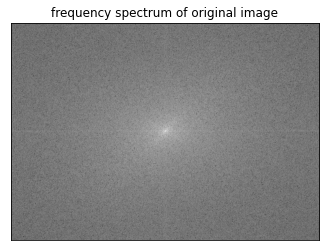

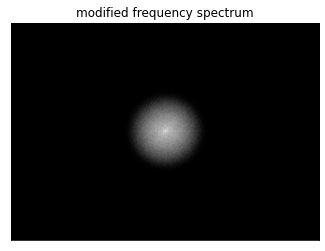

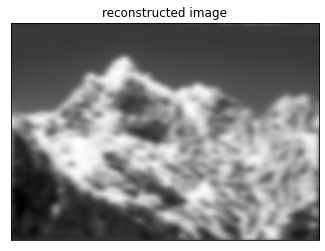

In [12]:
gaussian_lowpass(img_path,15)

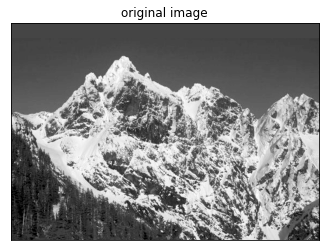

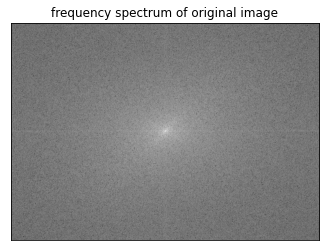

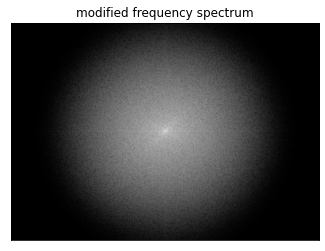

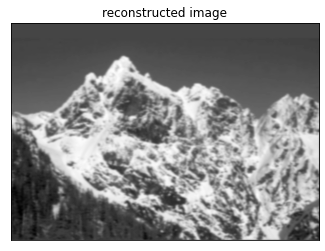

In [13]:
gaussian_lowpass(img_path,50)

# Observation
As D0 is increased, then more number of frequencies are allowed to pass, that's why blurring decreases.

Blurring and D0 are inversely proportional

# 8.3
By looking at the images of both gaussian and ideal low pass, it is clearly visible that both of them blurred the images, but ideal low pass images have ringing effect, which is not seen in gaussian.

In [3]:
# min filter
def erosion(img):
    plt.imshow(img, cmap='gray')
    plt.title('original image')
    plt.xticks([]), plt.yticks([]) 
    plt.show()

    w,h = img.shape
    arr1 = [-1,1,0,0]
    arr2 = [0,0,-1,1]
    op_img = np.zeros((w,h),img.dtype)

    for i in range(w):
        for j in range(h):
            mi = 256
            for k in range(4):
                if i+arr1[k]>=0 and i+arr1[k]<w and j+arr2[k]>=0 and j+arr2[k]<h:
                    mi = min(mi,img[i+arr1[k],j+arr2[k]])
                    
            op_img[i,j] = mi
                    
    plt.imshow(op_img, cmap='gray')
    plt.title('eroded image')
    plt.xticks([]), plt.yticks([]) 
    plt.show()
    
    op_img = img - op_img
    plt.imshow(op_img, cmap='gray')
    plt.title('boundary extraction using erosion')
    plt.xticks([]), plt.yticks([]) 
    plt.show()
                
    return op_img

In [9]:
# max filter
def dilation(img):
    plt.imshow(img, cmap='gray')
    plt.title('original image')
    plt.xticks([]), plt.yticks([]) 
    plt.show()
    
    w,h = img.shape
    arr1 = [-1,1,0,0]
    arr2 = [0,0,-1,1]
    op_img = np.zeros((w,h),img.dtype)

    for i in range(w):
        for j in range(h):
            ma = -1
            for k in range(4):
                if i+arr1[k]>=0 and i+arr1[k]<w and j+arr2[k]>=0 and j+arr2[k]<h:
                    ma = max(ma,img[i+arr1[k],j+arr2[k]])
            op_img[i,j] = ma
    
    plt.imshow(op_img, cmap='gray')
    plt.title('dilated image')
    plt.xticks([]), plt.yticks([]) 
    plt.show()
    
    op_img = op_img - img
    plt.imshow(op_img, cmap='gray')
    plt.title('boundary extraction using dilation')
    plt.xticks([]), plt.yticks([]) 
    plt.show()
                           
    return op_img

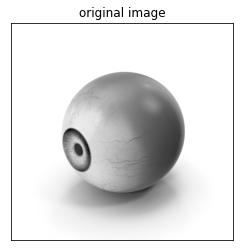

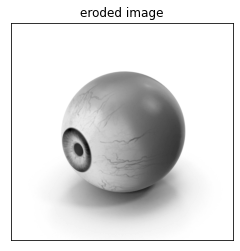

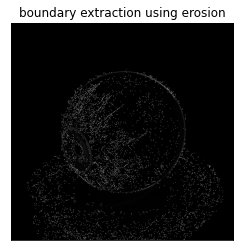

In [6]:
# 9
# as image is circular that's why taking cross(basically a plus sign) structuring element 
img = cv2.cvtColor(cv2.imread('../images/eye.png'), cv2.COLOR_BGR2GRAY)
    
# erosion
op_img1 = erosion(img)

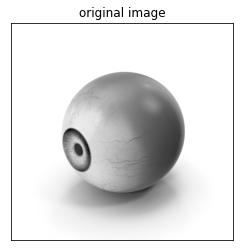

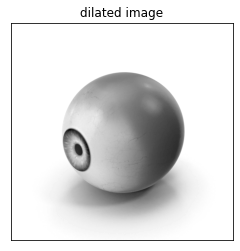

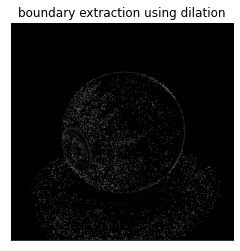

In [10]:
# dilation
op_img2 = dilation(img)

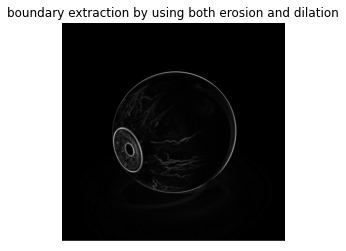

In [11]:
# adding boundary extracted images from both dilation and erosion
op_img = op_img1 + op_img2
plt.imshow(op_img, cmap='gray')
plt.title('boundary extraction by using both erosion and dilation')
plt.xticks([]), plt.yticks([]) 
plt.show()

In [53]:
# 10
def rotImage(img_path, angle):
    radians = float(angle*(math.pi/180))
    img = cv2.imread(img_path,0)
    
    w,h = img.shape
    width = math.floor(w*1.5)
    height = math.floor(h*1.5)
    fin_img = np.zeros((width,height),img.dtype)
    
    k1 = (width - w)//2
    k2 = (height - h)//2
    
    for i in range(w):
        for j in range(h):
            fin_img[i+k1,j+k2] = img[i,j]
            
    # center
    x = width//2
    y = height//2
    
    op_img = np.zeros((width,height),img.dtype)
    for i in range(width):
        for j in range(height):
            temp = fin_img[i,j]
            #forward mapping
            xf = (i-x)*math.cos(radians)-(j-y)*math.sin(radians)+x
            yf = (i-x)*math.sin(radians)+(j-y)*math.cos(radians)+x
            #backward mapping should change the forward mapping to the original image
            xbb = (i-x)*math.cos(radians)+(j-y)*math.sin(radians)+x
            ybb = -(i-x)*math.sin(radians)+(j-y)*math.cos(radians)+x
            xbb = int(xbb)
            ybb = int(ybb)
            if xf < width and yf < height and xf>0 and yf > 0:
                op_img[int(xf),int(yf)] = temp
    
    plt.imshow(op_img, cmap='gray')
    plt.title('Rotated Image by {} degrees anticlockwise'.format(angle))
    plt.xticks([]), plt.yticks([]) 
    plt.show()

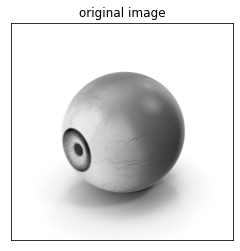

Dimensions of the image are: 561 x 574


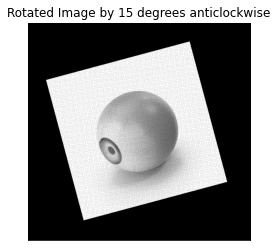

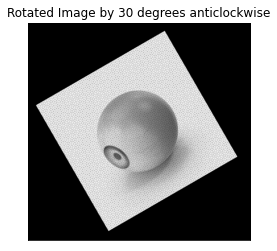

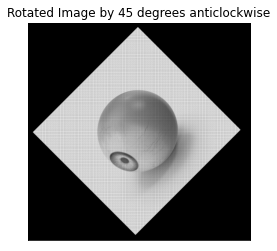

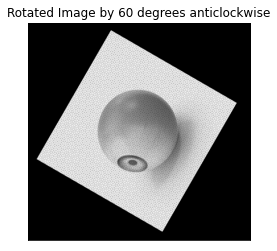

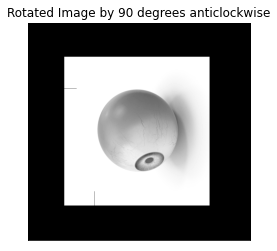

In [54]:
img_path = '../images/eye.png'
img = cv2.imread(img_path,0)
plt.imshow(img, cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()

width,height = img.shape
# for ensuring that image is rectangular     
print('Dimensions of the image are: {} x {}'.format(width,height))

rotImage(img_path,15)
rotImage(img_path,30)
rotImage(img_path,45)
rotImage(img_path,60)
rotImage(img_path,90)

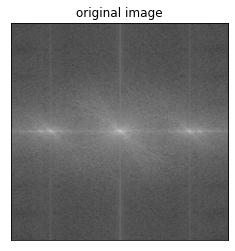

In [39]:
# 11
img = cv2.imread('../images/corruptedLena.jpg',0)
f = np.fft.fft2(img)
# Apply fft shift for visualization
fshift = np.fft.fftshift(f)
# We are only checking the magnitude 
# We use log as transformation, hence values should be > 1
magnitude_spectrum = np.log(np.abs(fshift) +1)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('original image')
plt.xticks([]), plt.yticks([]) 
plt.show()